In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import networkx as nx

from oasis.functions import deconvolve
from scipy.stats import pearsonr
from statistics import mean

from utils.context_data_csv import ContextDataCSV
from utils.matrix_optimizer import MatrixOptimizer

import utils.sulfur.constant as const

from utils.cofiring_graph_generator import CofiringGraphGenerator

/app/OASIS/oasis/functions.py:13: UserWarning: Could not find cvxpy. Don't worry, you can still use OASIS, just not the slower interior point methods we compared to in the papers.
  warn("Could not find cvxpy. Don't worry, you can still use OASIS, " +


In [2]:
engram_shock_cells = {
    'ID181106CreA': ['C261', 'C305', 'C347', 'C349', 'C351'],
    'ID181106CreB': ['C058', 'C089', 'C126'],
    'ID181106CreC': ['C017', 'C065', 'C112', 'C117', 'C203', 'C227'],
    'ID181106CreG': ['C127', 'C239', 'C323', 'C347', 'C350', 'C399', 'C402'],
    'ID181106CreH': ['C164', 'C180', 'C184', 'C243', 'C253', 'C298', 'C327', 'C351', 'C534', 'C542'],
    'ID181106CreI': ['C136', 'C197', 'C273', 'C292', 'C294', 'C306', 'C333'],
    'ID181106CreK': ['C083', 'C088', 'C100', 'C149', 'C390'],
    'ID181106CreL': ['C200'],
    'ID181106CreN': ['C199', 'C255', 'C258', 'C273'],
    'ID181106CreQ': ['C393']
}

non_engram_shock_cells = {
    'ID181106CreA': ['C000', 'C007', 'C009', 'C059', 'C076', 'C084', 'C086', 'C099', 'C101', 'C116', 'C120', 'C124', 'C141', 'C143', 'C145', 'C153', 'C164', 'C173', 'C175', 'C197', 'C198', 'C228', 'C234', 'C235', 'C284', 'C303', 'C306', 'C310', 'C317', 'C325', 'C327', 'C328', 'C336', 'C362', 'C377', 'C442', 'C459', 'C476', 'C479', 'C480', 'C487', 'C491', 'C493', 'C494', 'C519'],
    'ID181106CreB': ['C000', 'C003', 'C009', 'C010', 'C063', 'C066', 'C071', 'C072', 'C073', 'C080', 'C083', 'C088', 'C090', 'C094', 'C100', 'C103', 'C108', 'C109', 'C112', 'C114', 'C115', 'C127', 'C130', 'C131', 'C134', 'C166', 'C168', 'C169', 'C177', 'C178', 'C179', 'C200', 'C202', 'C203', 'C213', 'C230', 'C231', 'C268', 'C279', 'C282', 'C284'],
    'ID181106CreC': ['C002', 'C011', 'C012', 'C016', 'C019', 'C043', 'C045', 'C049', 'C050', 'C054', 'C055', 'C056', 'C058', 'C060', 'C063', 'C070', 'C072', 'C074', 'C076', 'C079', 'C084', 'C086', 'C088', 'C096', 'C105', 'C107', 'C118', 'C127', 'C132', 'C143', 'C144', 'C146', 'C153', 'C155', 'C160', 'C168', 'C186', 'C192', 'C193', 'C194', 'C198', 'C202', 'C205', 'C215', 'C219', 'C224', 'C233', 'C235', 'C237', 'C238', 'C239', 'C241', 'C256', 'C257', 'C262', 'C268', 'C272', 'C276', 'C287', 'C294', 'C295', 'C296'],
    'ID181106CreG': ['C003', 'C004', 'C005', 'C010', 'C011', 'C017', 'C025', 'C063', 'C067', 'C070', 'C071', 'C073', 'C076', 'C089', 'C102', 'C118', 'C126', 'C133', 'C136', 'C142', 'C157', 'C166', 'C177', 'C193', 'C197', 'C199', 'C204', 'C205', 'C210', 'C212', 'C229', 'C232', 'C244', 'C247', 'C249', 'C253', 'C261', 'C273', 'C286', 'C291', 'C293', 'C294', 'C298', 'C302', 'C304', 'C305', 'C309', 'C313', 'C325', 'C338', 'C344', 'C352', 'C353', 'C361', 'C377', 'C385', 'C426', 'C449', 'C458', 'C478'],
    'ID181106CreH': ['C018', 'C021', 'C059', 'C074', 'C081', 'C085', 'C087', 'C125', 'C127', 'C148', 'C160', 'C175', 'C203', 'C218', 'C232', 'C249', 'C252', 'C256', 'C261', 'C268', 'C271', 'C350', 'C361', 'C385', 'C386', 'C395', 'C397', 'C400', 'C404', 'C411', 'C475', 'C490', 'C493', 'C497', 'C498', 'C505', 'C511', 'C520', 'C521', 'C525', 'C529', 'C541', 'C579', 'C594', 'C603', 'C632', 'C636'],
    'ID181106CreI': ['C012', 'C049', 'C061', 'C143', 'C164', 'C166', 'C176', 'C183', 'C214', 'C249', 'C254', 'C256', 'C270', 'C275', 'C281', 'C302', 'C325', 'C326', 'C327', 'C341', 'C352', 'C368'],
    'ID181106CreK': ['C006', 'C045', 'C066', 'C071', 'C075', 'C080', 'C085', 'C102', 'C114', 'C117', 'C123', 'C124', 'C133', 'C136', 'C145', 'C178', 'C180', 'C202', 'C205', 'C206', 'C207', 'C208', 'C233', 'C238', 'C239', 'C243', 'C251', 'C262', 'C267', 'C277', 'C291', 'C297', 'C323', 'C325', 'C341', 'C352', 'C361', 'C376', 'C380', 'C399', 'C403', 'C411', 'C424', 'C428'],
    'ID181106CreL': ['C008', 'C015', 'C020', 'C021', 'C037', 'C040', 'C044', 'C049', 'C061', 'C069', 'C073', 'C074', 'C075', 'C082', 'C085', 'C123', 'C125', 'C126', 'C128', 'C129', 'C132', 'C133', 'C144', 'C150', 'C155', 'C162', 'C173', 'C180', 'C185', 'C196', 'C203', 'C209', 'C211', 'C213', 'C216', 'C224', 'C231', 'C236', 'C243', 'C255', 'C270', 'C273', 'C283', 'C298', 'C312', 'C315', 'C323', 'C332', 'C341', 'C343', 'C344', 'C346', 'C350', 'C353', 'C357', 'C373', 'C414', 'C416', 'C424', 'C439', 'C445', 'C456', 'C461', 'C463', 'C475', 'C498', 'C501'],
    'ID181106CreN': ['C008', 'C022', 'C028', 'C044', 'C048', 'C057', 'C062', 'C069', 'C079', 'C089', 'C098', 'C123', 'C144', 'C168', 'C186', 'C201', 'C204', 'C213', 'C217', 'C227', 'C228', 'C239', 'C261', 'C267', 'C288', 'C290', 'C301', 'C306', 'C309', 'C321', 'C343', 'C355', 'C391', 'C395', 'C397', 'C402', 'C404', 'C410', 'C412', 'C413', 'C416', 'C425', 'C429', 'C441', 'C463', 'C469', 'C490', 'C506', 'C511', 'C517'],
    'ID181106CreQ': ['C000', 'C001', 'C006', 'C009', 'C019', 'C022', 'C033', 'C034', 'C040', 'C042', 'C050', 'C055', 'C057', 'C059', 'C061', 'C070', 'C076', 'C089', 'C092', 'C098', 'C108', 'C118', 'C121', 'C122', 'C123', 'C127', 'C132', 'C134', 'C137', 'C168', 'C169', 'C173', 'C179', 'C181', 'C192', 'C202', 'C205', 'C207', 'C209', 'C214', 'C217', 'C239', 'C260', 'C263', 'C281', 'C284', 'C305', 'C308', 'C316', 'C325', 'C332', 'C333', 'C335', 'C336', 'C343', 'C347', 'C354', 'C362', 'C365', 'C368', 'C372', 'C374', 'C375', 'C380', 'C387', 'C398', 'C412', 'C417', 'C421', 'C426', 'C431', 'C434', 'C455', 'C456', 'C463', 'C464', 'C470', 'C485', 'C491']
}

all_shock_cells = {}
for animal_name in engram_shock_cells:
    all_shock_cells[animal_name] = engram_shock_cells[animal_name] + non_engram_shock_cells[animal_name]

In [3]:
index = const.ANIMAL_NAMES
columns_df = pd.DataFrame()
contexts = ['A1_1', 'A1_2', 'A1_3', 'A4_1', 'A4_2', 'A4_3']
features = ['clustering coefficient', 'shortest path length', 'co-firing strength', 'total weight', 'total number of edges', 'assortativity']
context_columns = []
for context_name in contexts:
    context_columns += [context_name] * len(features)
columns_df.loc[:, 'context'] = context_columns
columns_df.loc[:, 'feature'] = features * len(contexts)
columns = pd.MultiIndex.from_frame(columns_df)

df = pd.DataFrame(0.0, index=index, columns=columns)

In [4]:
def average_path_length(graph, weight='length'):
    def path_lengths(graph, node, weight='length'):
        lengths = []
        for target in graph:
            if not nx.has_path(graph, node, target) or node == target:
                continue
                
            lengths.append(nx.dijkstra_path_length(graph, node, target, weight=weight))
        
        return lengths
    
    all_lengths = []
    for node in graph:
        all_lengths.extend(path_lengths(graph, node, weight))
    
    return mean(all_lengths)

def calc_features(animal_name, context_name, graph, df):
    df.loc[animal_name, (context_name, 'clustering coefficient')] += nx.average_clustering(graph, weight='weight')
    df.loc[animal_name, (context_name, 'shortest path length')] += average_path_length(graph)
    
    adjacency_matrix = pd.DataFrame(nx.adjacency_matrix(graph).todense())
    df.loc[animal_name, (context_name, 'co-firing strength')] += adjacency_matrix.sum().mean()
    df.loc[animal_name, (context_name, 'assortativity')] += nx.degree_pearson_correlation_coefficient(graph, weight='weight')
    df.loc[animal_name, (context_name, 'total weight')] += sum(weight for _, _, weight in graph.edges.data("weight"))
    df.loc[animal_name, (context_name, 'total number of edges')] += len(graph.edges.data("weight"))
    
def average_features(animal_name, context_name, df, size):
    df.loc[animal_name, (context_name, 'clustering coefficient')] /= size
    df.loc[animal_name, (context_name, 'shortest path length')] /= size
    df.loc[animal_name, (context_name, 'co-firing strength')] /= size
    df.loc[animal_name, (context_name, 'assortativity')] /= size
    df.loc[animal_name, (context_name, 'total weight')] /= size
    df.loc[animal_name, (context_name, 'total number of edges')] /= size
    
def all_context_graph(generator, animal_name, context_name, df):
    iter_size = 100
    frame_range = 20
    
    for i in range(iter_size):
        index = i * frame_range
        graph = generator.run(index, index + frame_range)
        calc_features(animal_name, context_name, graph, df)
    average_features(animal_name, context_name, df, iter_size)

animal_name: ID181106CreA
##### context: A1post
##### context: A4post
animal_name: ID181106CreB
##### context: A1post
##### context: A4post
animal_name: ID181106CreC
##### context: A1post
##### context: A4post
animal_name: ID181106CreG
##### context: A1post
##### context: A4post
animal_name: ID181106CreH
##### context: A1post
##### context: A4post
animal_name: ID181106CreI
##### context: A1post
##### context: A4post
animal_name: ID181106CreK
##### context: A1post
##### context: A4post
animal_name: ID181106CreL
##### context: A1post
##### context: A4post
animal_name: ID181106CreN
##### context: A1post
##### context: A4post
animal_name: ID181106CreQ
##### context: A1post
##### context: A4post
CPU times: user 7h 21min 47s, sys: 31.1 s, total: 7h 22min 18s
Wall time: 6h 58min 33s


context                        A1_1                                          \
feature      clustering coefficient shortest path length co-firing strength   
ID181106CreA               0.081323             4.226740           9.512762   
ID181106CreB               0.105409             4.374731           6.624514   
ID181106CreC               0.104998             4.282063           8.528404   
ID181106CreG               0.076188             4.171085          10.583010   
ID181106CreH               0.080291             4.133713           9.176197   
ID181106CreI               0.070155             4.370254           6.011360   
ID181106CreK               0.109274             4.114985          12.056529   
ID181106CreL               0.098937             4.090065          12.729964   
ID181106CreN               0.080814             4.097748          11.808097   
ID181106CreQ               0.110452             4.051192          15.900760   

context                                                        \
feature      total weight total number of edges assortativity   
ID181106CreA  3648.144209                9514.0      0.189289   
ID181106CreB  1401.084704                3308.0      0.454279   
ID181106CreC  1944.476056                4958.0      0.290726   
ID181106CreG  4074.458864               11365.0      0.281158   
ID181106CreH  3927.412120                9963.0      0.242646   
ID181106CreI  1641.101247                4448.0      0.227898   
ID181106CreK  3665.184883                9174.0      0.291414   
ID181106CreL  4990.145905               12674.0      0.154690   
ID181106CreN  5284.123542               14198.0      0.295110   
ID181106CreQ  5374.457023               14186.0      0.160993   

context                        A1_2                                          \
feature      clustering coefficient shortest path length co-firing strength   
ID181106CreA               0.072466             4.252572           8.156785   
ID181106CreB               0.100612             4.329004           8.114902   
ID181106CreC               0.101646             4.248014           9.194404   
ID181106CreG               0.074708             4.168925          10.462270   
ID181106CreH               0.077965             4.110645           9.258220   
ID181106CreI               0.065070             4.366613           3.820315   
ID181106CreK               0.097189             4.219841           9.310642   
ID181106CreL               0.110053             4.044117          15.464579   
ID181106CreN               0.080775             4.091953          11.066087   
ID181106CreQ               0.123423             4.040885          17.160946   

context                    ...               A4_2               \
feature      total weight  ... co-firing strength total weight   
ID181106CreA  3128.126991  ...           6.554615  2513.694927   
ID181106CreB  1716.301828  ...           6.684335  1413.736874   
ID181106CreC  2096.324206  ...          11.576385  2639.415686   
ID181106CreG  4027.974043  ...          10.564844  4067.464828   
ID181106CreH  3962.518311  ...           9.701502  4152.242804   
ID181106CreI  1042.945869  ...           6.841590  1867.754168   
ID181106CreK  2830.435153  ...          12.756639  3878.018144   
ID181106CreL  6062.114906  ...          13.875622  5439.243673   
ID181106CreN  4952.073939  ...          14.135474  6325.624476   
ID181106CreQ  5800.399683  ...          15.424684  5213.543302   

context                                                            A4_3  \
feature      total number of edges assortativity clustering coefficient   
ID181106CreA                6282.0      0.390402               0.088109   
ID181106CreB                3763.0      0.389546               0.116212   
ID181106CreC                7258.0      0.243003               0.107601   
ID181106CreG               10522.0      0.211859               0.097116   
ID181106CreH               10229.0      0.349682               0.075906   
ID1

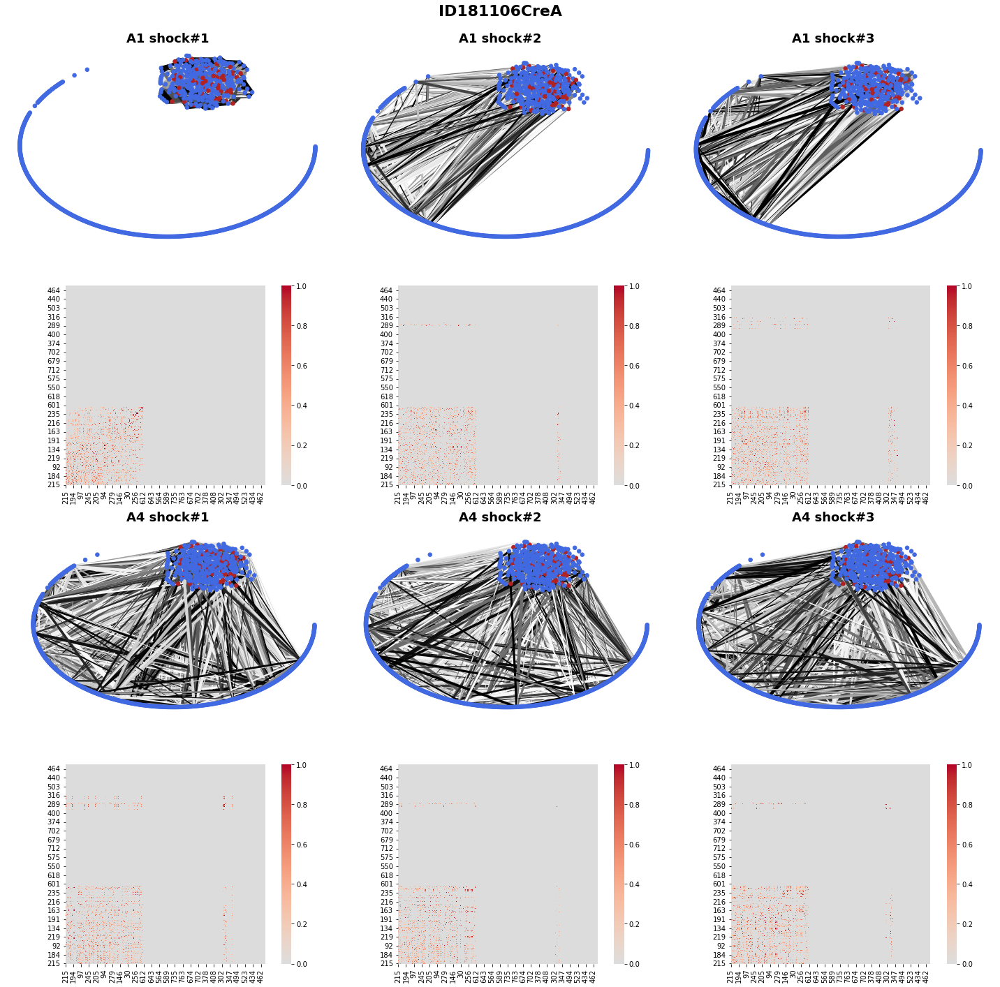

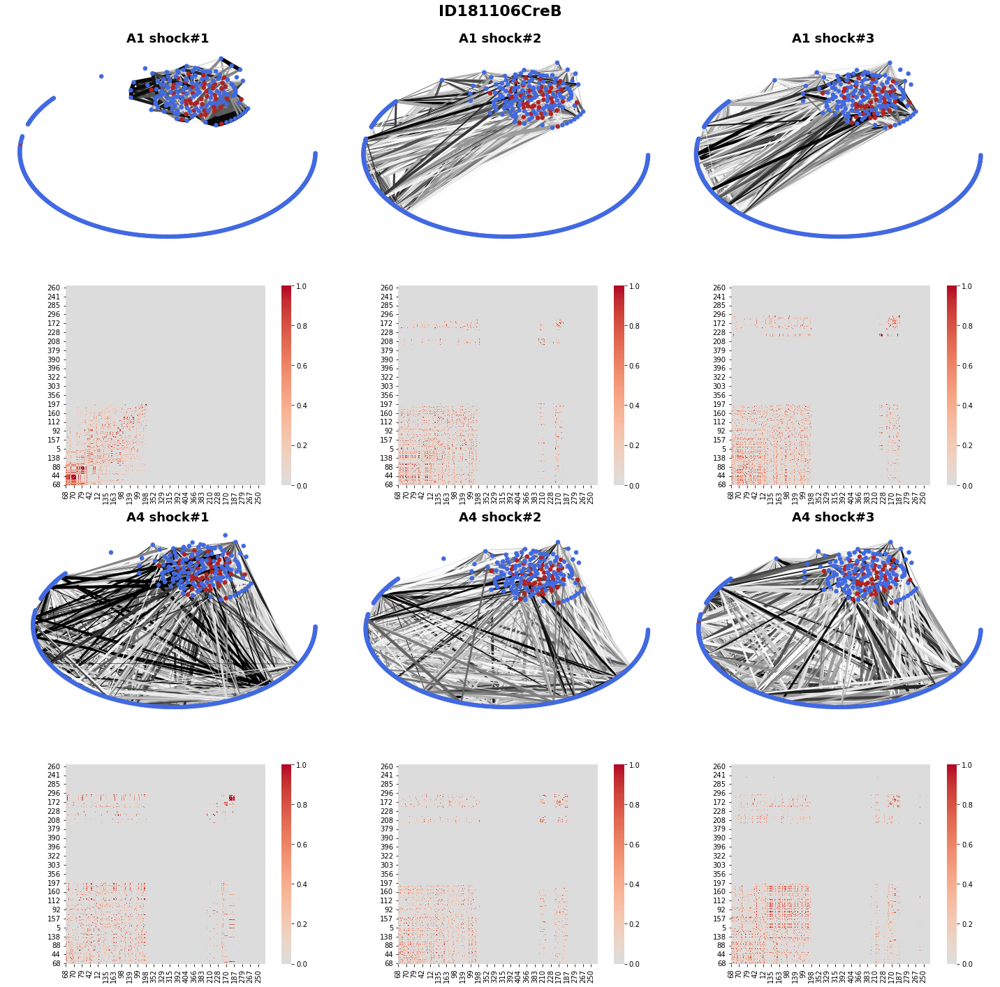

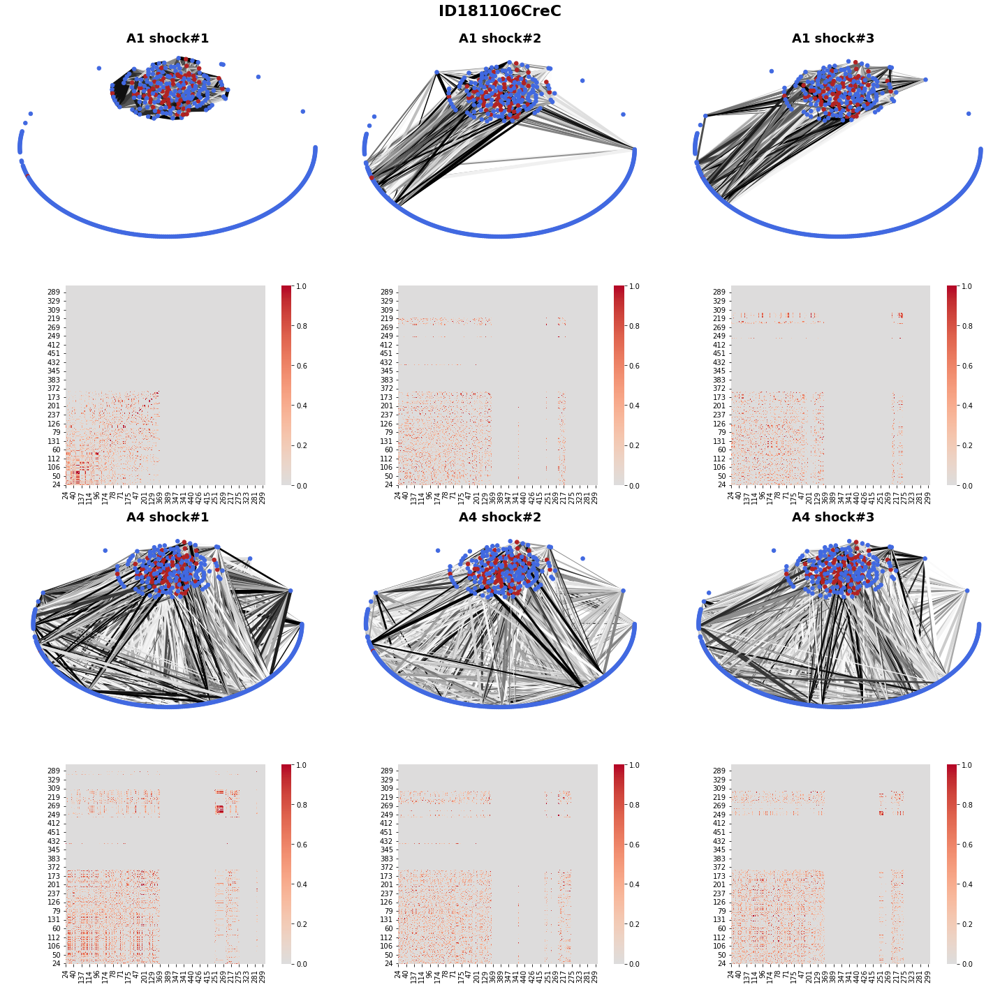

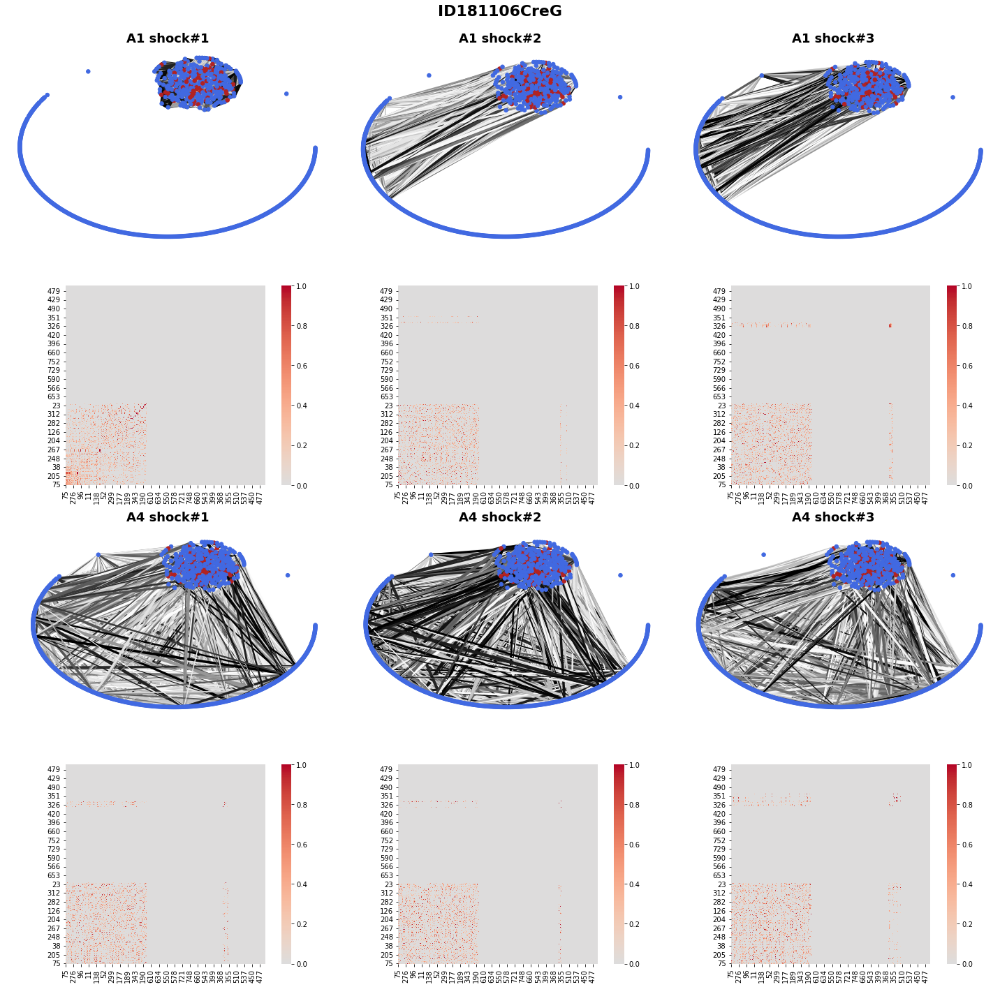

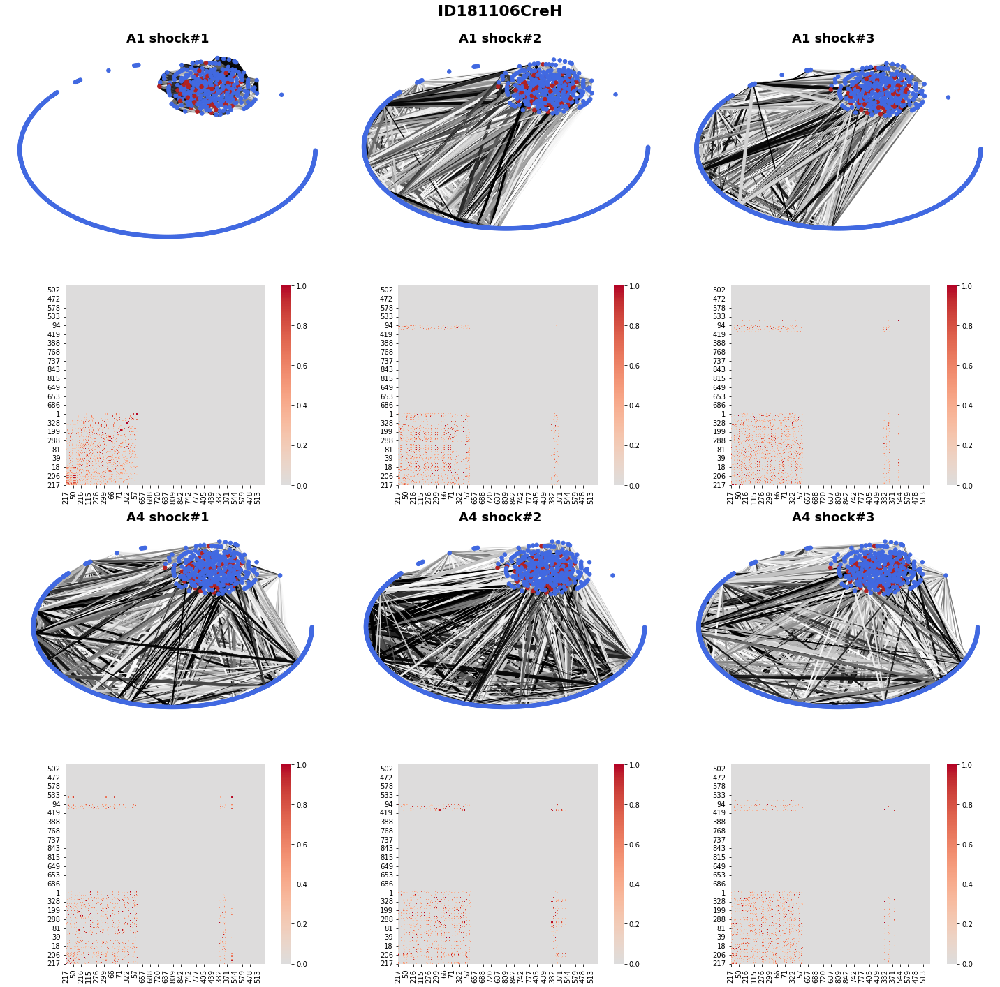

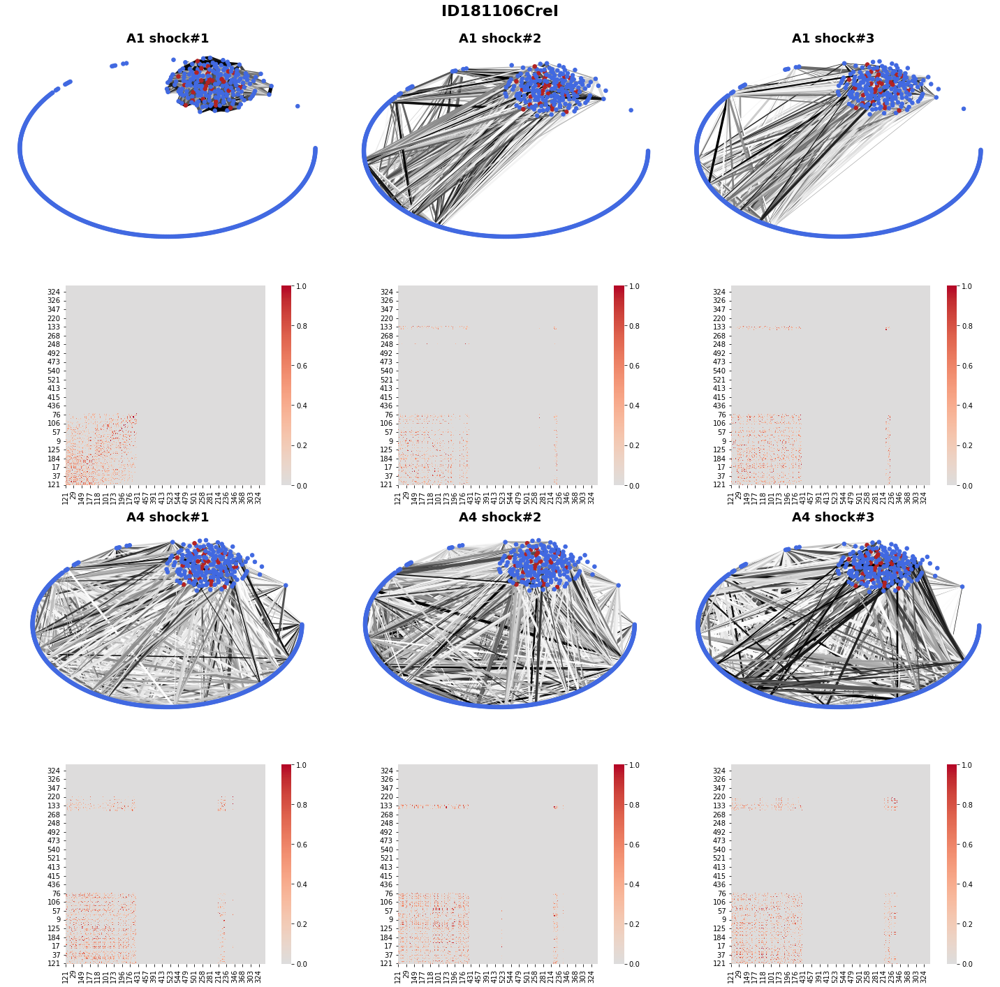

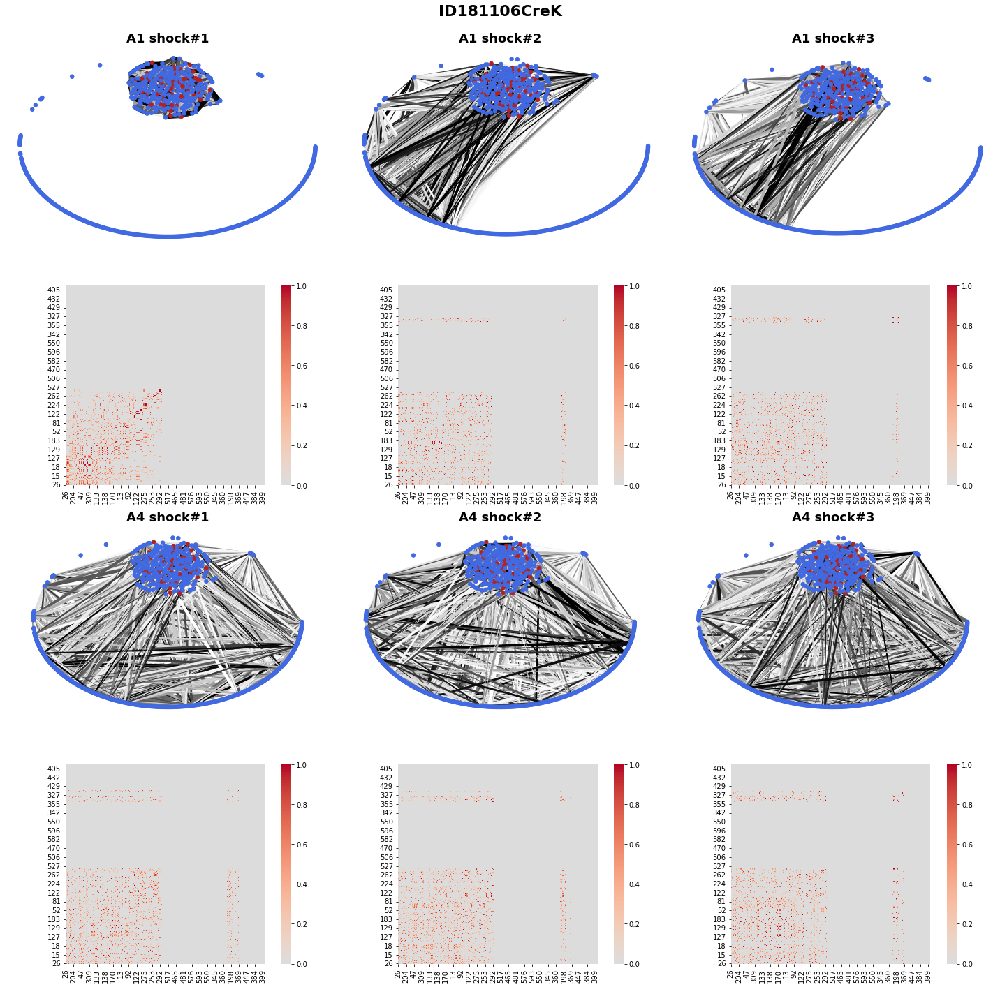

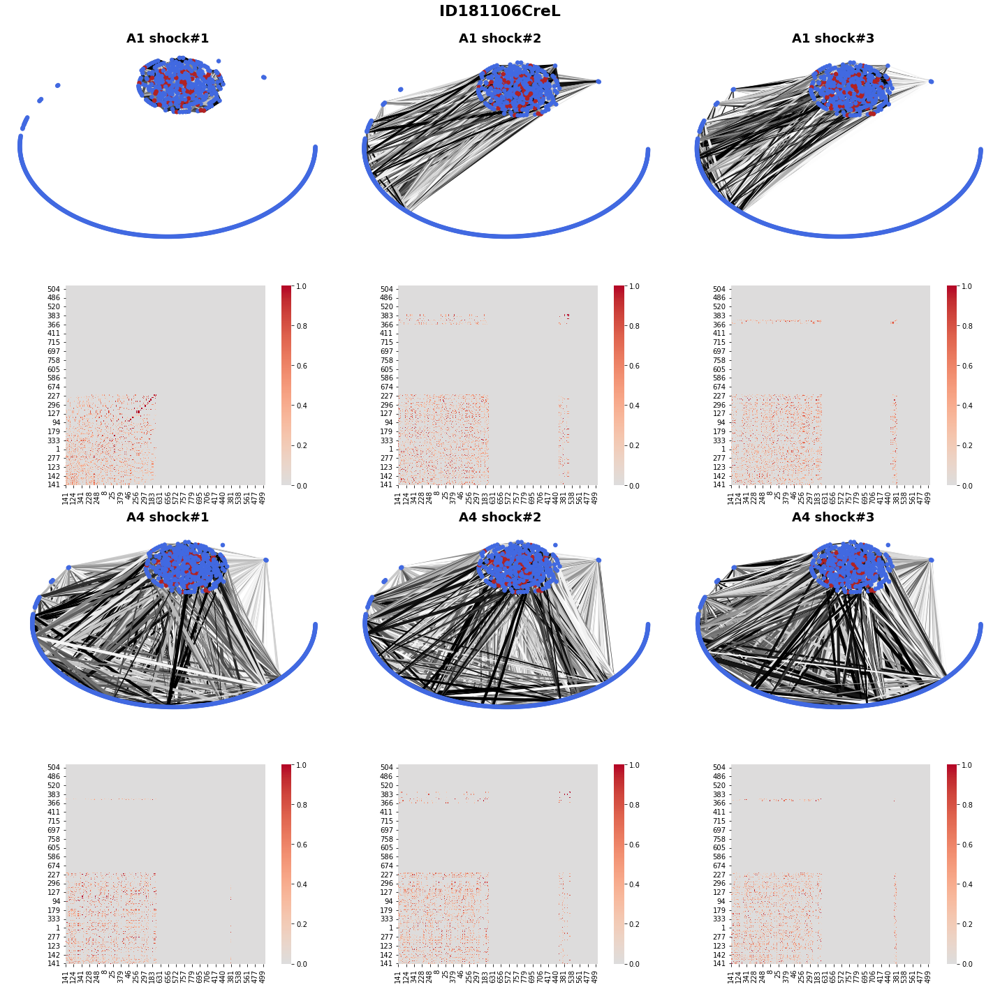

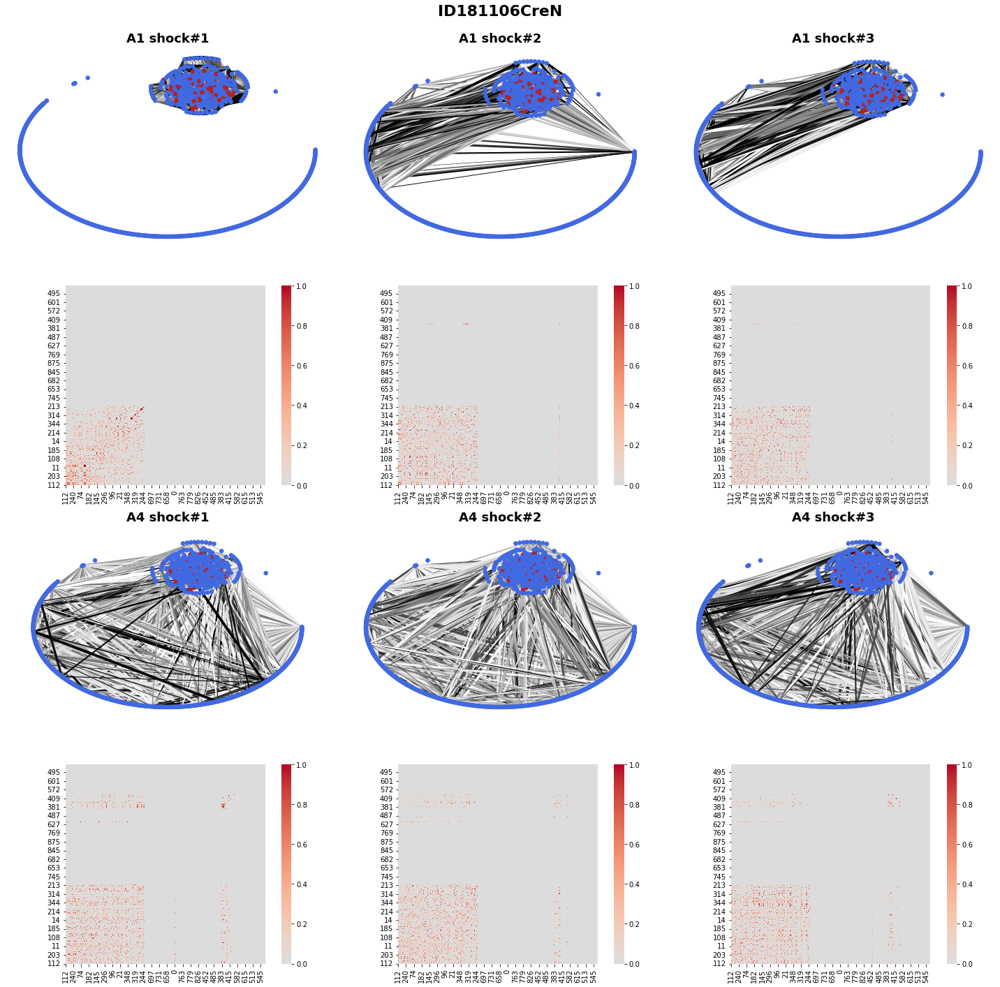

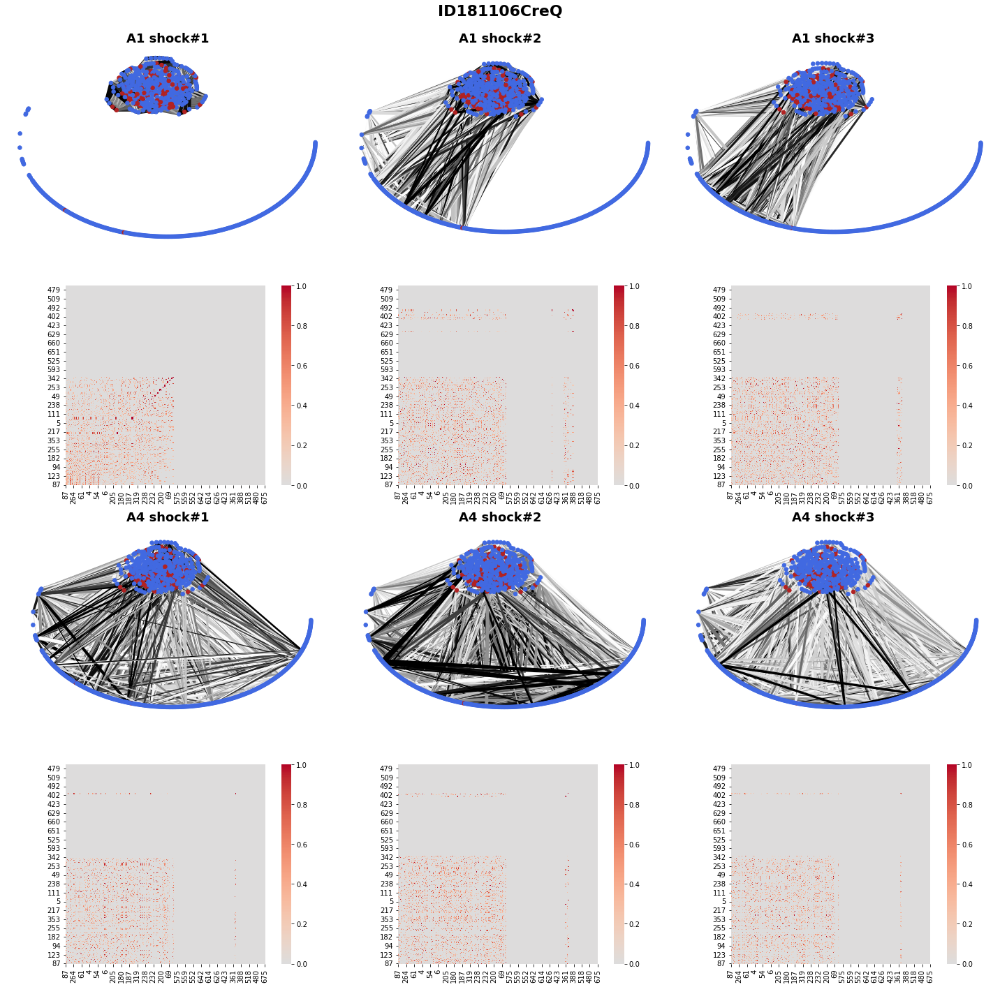

In [5]:
%%time

for animal_name in const.ANIMAL_NAMES:
    print('animal_name: %s' % animal_name)
    
    shock_cells = all_shock_cells[animal_name]
    
    def is_shock_cell(cell_name):
        return cell_name in shock_cells
    
    print('##### context: A1post')
    a1_csv = ContextDataCSV(animal_name, 'A1postES')
    a1_matrix = MatrixOptimizer(a1_csv.data_frame).divide_sd()
    
    a1_generator = CofiringGraphGenerator(a1_matrix, is_shock_cell)
    a1_1_graph = a1_generator.run(80, 100)
    a1_2_graph = a1_generator.run(980, 1000)
    a1_3_graph = a1_generator.run(1880, 1900)
    
    calc_features(animal_name, 'A1_1', a1_1_graph, df)
    calc_features(animal_name, 'A1_2', a1_2_graph, df)
    calc_features(animal_name, 'A1_3', a1_3_graph, df)
    
    print('##### context: A4post')
    a4_csv = ContextDataCSV(animal_name, 'A4postES')
    a4_matrix = MatrixOptimizer(a4_csv.data_frame).divide_sd()
    
    a4_generator = CofiringGraphGenerator(a4_matrix, is_shock_cell)
    a4_1_graph = a4_generator.run(80, 100)
    a4_2_graph = a4_generator.run(980, 1000)
    a4_3_graph = a4_generator.run(1880, 1900)
    
    calc_features(animal_name, 'A4_1', a4_1_graph, df)
    calc_features(animal_name, 'A4_2', a4_2_graph, df)
    calc_features(animal_name, 'A4_3', a4_3_graph, df)
    
    fig, axes = plt.subplots(ncols=3, nrows=4, figsize=(20, 20))
        
    pos = nx.kamada_kawai_layout(a1_1_graph)
    node_size = 30.0
    adjacency_matrixes = []
    
    a1_1_edges, a1_1_weights = zip(*nx.get_edge_attributes(a1_1_graph, 'weight').items())
    a1_1_node_colors = [options["color"] for cell_name, options in a1_1_graph.nodes(data=True)]
    nx.draw(a1_1_graph, pos, node_size=node_size, node_color=a1_1_node_colors, edgelist=a1_1_edges, edge_color=a1_1_weights, width=(np.array(a1_1_weights) * 5), edge_cmap=plt.cm.Greys, ax=axes[0][0])
    axes[0][0].set_title('A1 shock#1', fontsize=18, fontweight='bold')
    
    a1_1_adjacency_matrix = pd.DataFrame(nx.adjacency_matrix(a1_1_graph).toarray())
    adjacency_matrixes.append(a1_1_adjacency_matrix.copy(deep=True))
    ordered_high_weight_index = a1_1_adjacency_matrix.sum().sort_values(ascending=False).index
    a1_1_adjacency_matrix = a1_1_adjacency_matrix.reindex(index=ordered_high_weight_index, columns=ordered_high_weight_index, copy=True)
    
    ax = sns.heatmap(a1_1_adjacency_matrix, square=True, cmap='coolwarm', center=0.0, ax=axes[1][0])
    ax.invert_yaxis()
    
    a1_2_edges, a1_2_weights = zip(*nx.get_edge_attributes(a1_2_graph, 'weight').items())
    a1_2_node_colors = [options["color"] for cell_name, options in a1_2_graph.nodes(data=True)]
    nx.draw(a1_2_graph, pos, node_size=node_size, node_color=a1_2_node_colors, edgelist=a1_2_edges, edge_color=a1_2_weights, width=(np.array(a1_1_weights) * 5), edge_cmap=plt.cm.Greys, ax=axes[0][1])
    axes[0][1].set_title('A1 shock#2', fontsize=18, fontweight='bold')
    
    a1_2_adjacency_matrix = pd.DataFrame(nx.adjacency_matrix(a1_2_graph).toarray())
    adjacency_matrixes.append(a1_2_adjacency_matrix.copy(deep=True))
    a1_2_adjacency_matrix = a1_2_adjacency_matrix.reindex(index=ordered_high_weight_index, columns=ordered_high_weight_index, copy=True)
    
    ax = sns.heatmap(a1_2_adjacency_matrix, square=True, cmap='coolwarm', center=0.0, ax=axes[1][1])
    ax.invert_yaxis()
    
    a1_3_edges, a1_3_weights = zip(*nx.get_edge_attributes(a1_3_graph, 'weight').items())
    a1_3_node_colors = [options["color"] for cell_name, options in a1_3_graph.nodes(data=True)]
    nx.draw(a1_3_graph, pos, node_size=node_size, node_color=a1_3_node_colors, edgelist=a1_3_edges, edge_color=a1_3_weights, width=(np.array(a1_1_weights) * 5), edge_cmap=plt.cm.Greys, ax=axes[0][2])
    axes[0][2].set_title('A1 shock#3', fontsize=18, fontweight='bold')
    
    a1_3_adjacency_matrix = pd.DataFrame(nx.adjacency_matrix(a1_3_graph).toarray())
    adjacency_matrixes.append(a1_3_adjacency_matrix.copy(deep=True))
    a1_3_adjacency_matrix = a1_3_adjacency_matrix.reindex(index=ordered_high_weight_index, columns=ordered_high_weight_index, copy=True)
    
    ax = sns.heatmap(a1_3_adjacency_matrix, square=True, cmap='coolwarm', center=0.0, ax=axes[1][2])
    ax.invert_yaxis()
    
    a4_1_edges, a4_1_weights = zip(*nx.get_edge_attributes(a4_1_graph, 'weight').items())
    a4_1_node_colors = [options["color"] for cell_name, options in a4_1_graph.nodes(data=True)]
    nx.draw(a4_1_graph, pos, node_size=node_size, node_color=a4_1_node_colors, edgelist=a4_1_edges, edge_color=a4_1_weights, width=(np.array(a1_1_weights) * 5), edge_cmap=plt.cm.Greys, ax=axes[2][0])
    axes[2][0].set_title('A4 shock#1', fontsize=18, fontweight='bold')
    
    a4_1_adjacency_matrix = pd.DataFrame(nx.adjacency_matrix(a4_1_graph).toarray())
    adjacency_matrixes.append(a4_1_adjacency_matrix.copy(deep=True))
    a4_1_adjacency_matrix = a4_1_adjacency_matrix.reindex(index=ordered_high_weight_index, columns=ordered_high_weight_index, copy=True)
    
    ax = sns.heatmap(a4_1_adjacency_matrix, square=True, cmap='coolwarm', center=0.0, ax=axes[3][0])
    ax.invert_yaxis()
    
    a4_2_edges, a4_2_weights = zip(*nx.get_edge_attributes(a4_2_graph, 'weight').items())
    a4_2_node_colors = [options["color"] for cell_name, options in a4_2_graph.nodes(data=True)]
    nx.draw(a4_2_graph, pos, node_size=node_size, node_color=a4_2_node_colors, edgelist=a4_2_edges, edge_color=a4_2_weights, width=(np.array(a1_1_weights) * 5), edge_cmap=plt.cm.Greys, ax=axes[2][1])
    axes[2][1].set_title('A4 shock#2', fontsize=18, fontweight='bold')
    
    a4_2_adjacency_matrix = pd.DataFrame(nx.adjacency_matrix(a4_2_graph).toarray())
    adjacency_matrixes.append(a4_2_adjacency_matrix.copy(deep=True))
    a4_2_adjacency_matrix = a4_2_adjacency_matrix.reindex(index=ordered_high_weight_index, columns=ordered_high_weight_index, copy=True)
    
    ax = sns.heatmap(a4_2_adjacency_matrix, square=True, cmap='coolwarm', center=0.0, ax=axes[3][1])
    ax.invert_yaxis()
    
    a4_3_edges, a4_3_weights = zip(*nx.get_edge_attributes(a4_3_graph, 'weight').items())
    a4_3_node_colors = [options["color"] for cell_name, options in a4_3_graph.nodes(data=True)]
    nx.draw(a4_3_graph, pos, node_size=node_size, node_color=a4_3_node_colors, edgelist=a4_3_edges, edge_color=a4_3_weights, width=(np.array(a1_1_weights) * 5), edge_cmap=plt.cm.Greys, ax=axes[2][2])
    axes[2][2].set_title('A4 shock#3', fontsize=18, fontweight='bold')
    
    a4_3_adjacency_matrix = pd.DataFrame(nx.adjacency_matrix(a4_3_graph).toarray())
    adjacency_matrixes.append(a4_3_adjacency_matrix.copy(deep=True))
    a4_3_adjacency_matrix = a4_3_adjacency_matrix.reindex(index=ordered_high_weight_index, columns=ordered_high_weight_index, copy=True)
    ax = sns.heatmap(a4_3_adjacency_matrix, square=True, cmap='coolwarm', center=0.0, ax=axes[3][2])
    ax.invert_yaxis()
    
    fig.tight_layout(rect=[0, 0, 1, 0.96])
    fig.suptitle(animal_name, fontsize=22, fontweight='bold')
    fig.show()
    
df

/tmp/ipykernel_138/3111130534.py:10: UserWarning: FixedFormatter should only be used together with FixedLocator
  axes[0][0].set_xticklabels(x, rotation=70)
/tmp/ipykernel_138/3111130534.py:18: UserWarning: FixedFormatter should only be used together with FixedLocator
  axes[0][1].set_xticklabels(x, rotation=70)
/tmp/ipykernel_138/3111130534.py:26: UserWarning: FixedFormatter should only be used together with FixedLocator
  axes[0][2].set_xticklabels(x, rotation=70)
/tmp/ipykernel_138/3111130534.py:34: UserWarning: FixedFormatter should only be used together with FixedLocator
  axes[1][0].set_xticklabels(x, rotation=70)
/tmp/ipykernel_138/3111130534.py:42: UserWarning: FixedFormatter should only be used together with FixedLocator
  axes[1][1].set_xticklabels(x, rotation=70)
/tmp/ipykernel_138/3111130534.py:50: UserWarning: FixedFormatter should only be used together with FixedLocator
  axes[1][2].set_xticklabels(x, rotation=70)


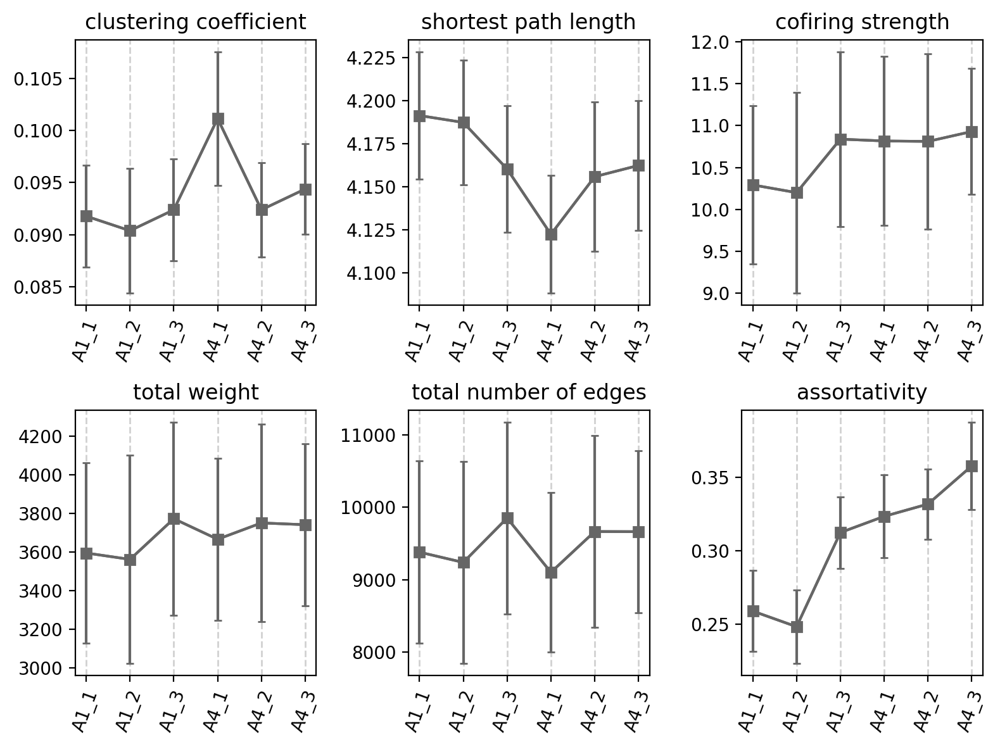

In [6]:
fig, axes = plt.subplots(ncols=3, nrows=2, figsize=(8, 6), tight_layout=True, dpi=200)

x = ['A1_1', 'A1_2', 'A1_3', 'A4_1', 'A4_2', 'A4_3']
summary_df = df
clustering_cff_df = summary_df.iloc[:, 0::6]
clustering_cff_mean, clustering_cff_sem = clustering_cff_df.mean(), clustering_cff_df.sem()
axes[0][0].errorbar(x, clustering_cff_mean, yerr=clustering_cff_sem, capsize=2, color='0.4')
axes[0][0].plot(x, clustering_cff_mean, marker="s", markersize=6, color='0.4')
axes[0][0].set_title('clustering coefficient')
axes[0][0].set_xticklabels(x, rotation=70)
axes[0][0].grid(which = "major", axis = "x", color = "0.7", alpha = 0.6, linestyle = "--", linewidth = 1)

shortest_path_df = summary_df.iloc[:, 1::6]
shortest_path_mean, shortest_path_sem = shortest_path_df.mean(), shortest_path_df.sem()
axes[0][1].errorbar(x, shortest_path_mean, yerr=shortest_path_sem, capsize=2, color='0.4')
axes[0][1].plot(x, shortest_path_mean, marker="s", markersize=6, color='0.4')
axes[0][1].set_title('shortest path length')
axes[0][1].set_xticklabels(x, rotation=70)
axes[0][1].grid(which = "major", axis = "x", color = "0.7", alpha = 0.6, linestyle = "--", linewidth = 1)

cofiring_strength_df = summary_df.iloc[:, 2::6]
cofiring_strength_mean, cofiring_strength_sem = cofiring_strength_df.mean(), cofiring_strength_df.sem()
axes[0][2].errorbar(x, cofiring_strength_mean, yerr=cofiring_strength_sem, capsize=2, color='0.4')
axes[0][2].plot(x, cofiring_strength_mean, marker="s", markersize=6, color='0.4')
axes[0][2].set_title('cofiring strength')
axes[0][2].set_xticklabels(x, rotation=70)
axes[0][2].grid(which = "major", axis = "x", color = "0.7", alpha = 0.6, linestyle = "--", linewidth = 1)

total_weight_df = summary_df.iloc[:, 3::6]
total_weight_mean, total_weight_sem = total_weight_df.mean(), total_weight_df.sem()
axes[1][0].errorbar(x, total_weight_mean, yerr=total_weight_sem, capsize=2, color='0.4')
axes[1][0].plot(x, total_weight_mean, marker="s", markersize=6, color='0.4')
axes[1][0].set_title('total weight')
axes[1][0].set_xticklabels(x, rotation=70)
axes[1][0].grid(which = "major", axis = "x", color = "0.7", alpha = 0.6, linestyle = "--", linewidth = 1)

total_edge_df = summary_df.iloc[:, 4::6]
total_edge_mean, total_edge_sem = total_edge_df.mean(), total_edge_df.sem()
axes[1][1].errorbar(x, total_edge_mean, yerr=total_edge_sem, capsize=2, color='0.4')
axes[1][1].plot(x, total_edge_mean, marker="s", markersize=6, color='0.4')
axes[1][1].set_title('total number of edges')
axes[1][1].set_xticklabels(x, rotation=70)
axes[1][1].grid(which = "major", axis = "x", color = "0.7", alpha = 0.6, linestyle = "--", linewidth = 1)

assortativity_df = summary_df.iloc[:, 5::6]
assortativity_mean, assortativity_sem = assortativity_df.mean(), assortativity_df.sem()
axes[1][2].errorbar(x, assortativity_mean, yerr=assortativity_sem, capsize=2, color='0.4')
axes[1][2].plot(x, assortativity_mean, marker="s", markersize=6, color='0.4')
axes[1][2].set_title('assortativity')
axes[1][2].set_xticklabels(x, rotation=70)
axes[1][2].grid(which = "major", axis = "x", color = "0.7", alpha = 0.6, linestyle = "--", linewidth = 1)

fig.show()

In [7]:
df

context                        A1_1                                          \
feature      clustering coefficient shortest path length co-firing strength   
ID181106CreA               0.081323             4.226740           9.512762   
ID181106CreB               0.105409             4.374731           6.624514   
ID181106CreC               0.104998             4.282063           8.528404   
ID181106CreG               0.076188             4.171085          10.583010   
ID181106CreH               0.080291             4.133713           9.176197   
ID181106CreI               0.070155             4.370254           6.011360   
ID181106CreK               0.109274             4.114985          12.056529   
ID181106CreL               0.098937             4.090065          12.729964   
ID181106CreN               0.080814             4.097748          11.808097   
ID181106CreQ               0.110452             4.051192          15.900760   

context                                                        \
feature      total weight total number of edges assortativity   
ID181106CreA  3648.144209                9514.0      0.189289   
ID181106CreB  1401.084704                3308.0      0.454279   
ID181106CreC  1944.476056                4958.0      0.290726   
ID181106CreG  4074.458864               11365.0      0.281158   
ID181106CreH  3927.412120                9963.0      0.242646   
ID181106CreI  1641.101247                4448.0      0.227898   
ID181106CreK  3665.184883                9174.0      0.291414   
ID181106CreL  4990.145905               12674.0      0.154690   
ID181106CreN  5284.123542               14198.0      0.295110   
ID181106CreQ  5374.457023               14186.0      0.160993   

context                        A1_2                                          \
feature      clustering coefficient shortest path length co-firing strength   
ID181106CreA               0.072466             4.252572           8.156785   
ID181106CreB               0.100612             4.329004           8.114902   
ID181106CreC               0.101646             4.248014           9.194404   
ID181106CreG               0.074708             4.168925          10.462270   
ID181106CreH               0.077965             4.110645           9.258220   
ID181106CreI               0.065070             4.366613           3.820315   
ID181106CreK               0.097189             4.219841           9.310642   
ID181106CreL               0.110053             4.044117          15.464579   
ID181106CreN               0.080775             4.091953          11.066087   
ID181106CreQ               0.123423             4.040885          17.160946   

context                    ...               A4_2               \
feature      total weight  ... co-firing strength total weight   
ID181106CreA  3128.126991  ...           6.554615  2513.694927   
ID181106CreB  1716.301828  ...           6.684335  1413.736874   
ID181106CreC  2096.324206  ...          11.576385  2639.415686   
ID181106CreG  4027.974043  ...          10.564844  4067.464828   
ID181106CreH  3962.518311  ...           9.701502  4152.242804   
ID181106CreI  1042.945869  ...           6.841590  1867.754168   
ID181106CreK  2830.435153  ...          12.756639  3878.018144   
ID181106CreL  6062.114906  ...          13.875622  5439.243673   
ID181106CreN  4952.073939  ...          14.135474  6325.624476   
ID181106CreQ  5800.399683  ...          15.424684  5213.543302   

context                                                            A4_3  \
feature      total number of edges assortativity clustering coefficient   
ID181106CreA                6282.0      0.390402               0.088109   
ID181106CreB                3763.0      0.389546               0.116212   
ID181106CreC                7258.0      0.243003               0.107601   
ID181106CreG               10522.0      0.211859               0.097116   
ID181106CreH               10229.0      0.349682               0.075906   
ID1